<a href="https://colab.research.google.com/github/AmoguJUduka/MachineLearning/blob/main/CustomerChurn/CustomerChurnDataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

In [2]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Read the file from your Drive
df = pd.read_csv('/content/drive/MyDrive/Customer_Churn_Modelling.csv')

Mounted at /content/drive


In [3]:
X = df.iloc[:,3:-1]
X

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary
0,619,France,Female,42,2,0.00,1,1,1,101348.88
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58
2,502,France,Female,42,8,159660.80,3,1,0,113931.57
3,699,France,Female,39,1,0.00,2,0,0,93826.63
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10
...,...,...,...,...,...,...,...,...,...,...
9995,771,France,Male,39,5,0.00,2,1,0,96270.64
9996,516,France,Male,35,10,57369.61,1,1,1,101699.77
9997,709,France,Female,36,7,0.00,1,0,1,42085.58
9998,772,Germany,Male,42,3,75075.31,2,1,0,92888.52


In [4]:
y = df["Exited"]

# Data Visualization

<Axes: xlabel='Exited', ylabel='count'>

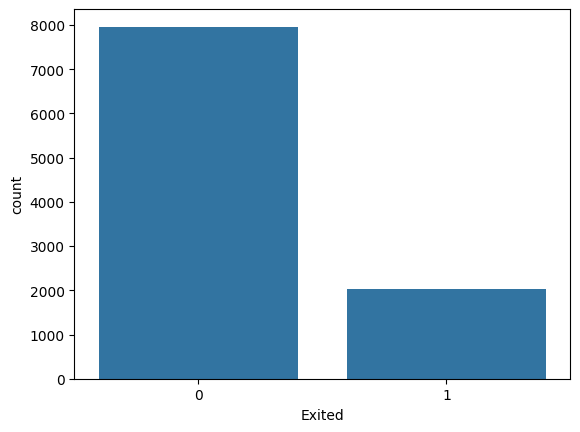

In [5]:
sns.countplot(x=y)

In [6]:
plt.rcParams['figure.figsize'] = (15,3)
plt.rcParams['figure.dpi'] = 300

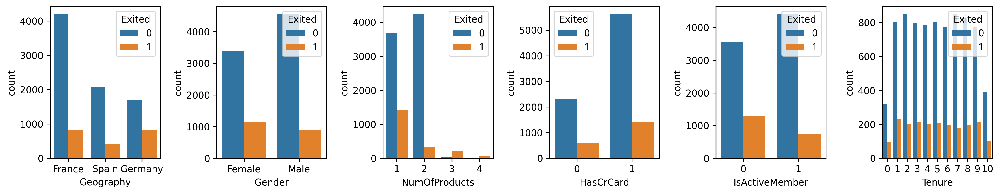

In [7]:
fig, ax = plt.subplots(1,6)
sns.countplot(x='Geography', data = X, ax=ax[0], hue = y)
sns.countplot(x='Gender', data = X, ax=ax[1], hue = y)
sns.countplot(x='NumOfProducts', data = X, ax=ax[2], hue = y)
sns.countplot(x='HasCrCard', data = X, ax=ax[3], hue = y)
sns.countplot(x='IsActiveMember', data = X, ax=ax[4], hue = y)
sns.countplot(x='Tenure', data = X, ax=ax[5], hue = y)

plt.tight_layout()

# Data Visualization 2

In [8]:
X.columns

Index(['CreditScore', 'Geography', 'Gender', 'Age', 'Tenure', 'Balance',
       'NumOfProducts', 'HasCrCard', 'IsActiveMember', 'EstimatedSalary'],
      dtype='object')

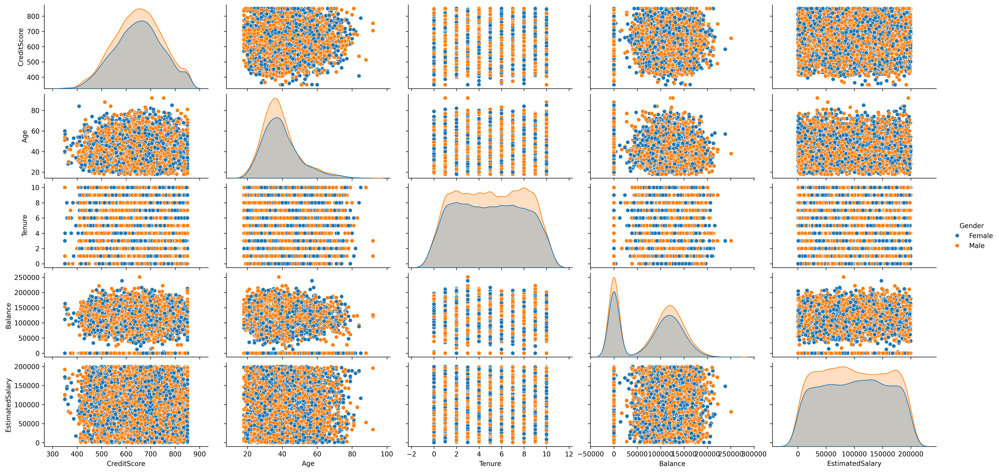

In [9]:
sns.pairplot(X, vars=['CreditScore', 'Age', 'Tenure', 'Balance','EstimatedSalary'], height = 2, aspect=2, hue = "Gender")

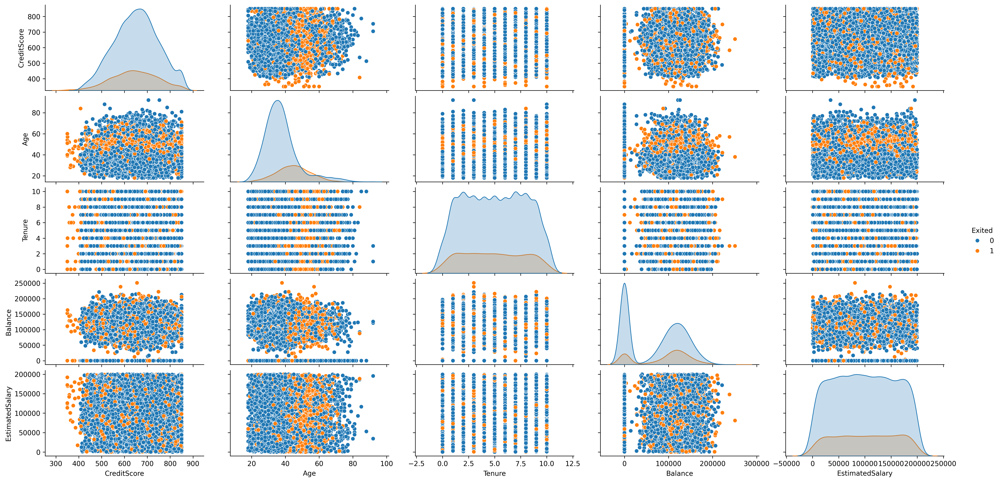

In [10]:
sns.pairplot(df, vars=['CreditScore', 'Age', 'Tenure', 'Balance','EstimatedSalary'], height = 2, aspect=2, hue = "Exited")

# Data Preprocessing

In [11]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [12]:
X_onehot = pd.get_dummies(X, drop_first=True) #One Hot Encoding

In [13]:
X_train, X_test,y_train, y_test = train_test_split(X_onehot, y, test_size = 0.2, random_state = 42, stratify=y)

In [14]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.fit_transform(X_test)

Building the Neural Network

In [15]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense, InputLayer
from tensorflow.keras.optimizers import Adam

In [16]:
input_shape = X_train.shape[1:]

In [17]:
class_weight = y.value_counts().to_dict()

In [18]:
total_sample = sum(class_weight.values())

class_weight = [total_sample/(len(class_weight)*class_weight[0]), total_sample/(len(class_weight)*class_weight[1])]

In [19]:
class_weight

[0.6279040562602034, 2.454590083456063]

In [20]:
model = Sequential()
model.add(InputLayer(input_shape=input_shape))
model.add(Dense(128, activation='relu'))
model.add(Dense(128, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/input_layer.py:26: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


In [21]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 128)                 │           1,536 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 128)                 │          16,512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,177 (71.00 KB)

 Trainable params: 18,177 (71.00 KB)

 Non-trainable params: 0 (0.00 B)

In [22]:
model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])